# Análisis Estadístico de HHRR IBM
## Dataset Columns
- **Age**: Edad
- **DailyRate**: Tarifa Diaria
- **DistanceFromHome**: Distancia desde casa
- **Education**: Nivel de Educación
- **EnvironmentSatisfaction**: Satisfacción Laboral pero en el contexto del entorno físico
- **HourlyRate**: Tarifa por Hora
- **JobInvolvement**: Compromiso con el Trabajo
- **JobLevel**: Nivel de trabajo
- **JobSatisfaction**: Satisfacción de trabajo con su Rol Actual
- **MonthlyIncome**: Ingresos Mensuales
- **MonthlyRate**: Tarifa Mensual
- **NumCompaniesWorked**: Número de compañías en las cuales trabajó
- **PercentSalaryHike**: Porcentaje de incremento salarial
- **PerformanceRating**: Calificación de Desenvolvimiento
- **RelationshipSatisfaction**: Satisfacción interpersonal
- **StandardHours**: Horas Estándar
- **StockOptionLevel**: Tipos de opciones que un empleado tiene para adquirir acciones de la empresa
- **TotalWorkingYears**: Horas trabajadas por Año
- **TrainingTimesLastYear**: Entrenamientos recibidos el último año
- **WorkLifeBalance**: Balance laboral y personal
- **YearsAtCompany**: Años en la compañía
- **YearsInCurrentRole**: Años en el Rol Actúal
- **YearsSinceLastPromotion**: Años que han pasado desde el último ascenso.
- **YearsWithCurrManager**: Años con el manager actual

## Libs to use

In [161]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from IPython.display import display
from math import pi
import plotly.graph_objects as go


## Quantitative Columns

In [4]:

df = pd.read_csv("caso_hr_analytics_ibm/WA_Fn-UseC_-HR-Employee-Attrition.csv")

# all int64 types
quantitative_columns = ['Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate',
                        'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
                        'TotalWorkingYears', 'TrainingTimesLastYear',
                        'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
                        'YearsWithCurrManager'
                       ]
df[quantitative_columns].head()


,Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,1,94,5993,19479,8,11,8,0,6,4,0,5
1,49,279,8,61,5130,24907,1,23,10,3,10,7,1,7
2,37,1373,2,92,2090,2396,6,15,7,3,0,0,0,0
3,33,1392,3,56,2909,23159,1,11,8,3,8,7,3,0
4,27,591,2,40,3468,16632,9,12,6,3,2,2,2,2


## Cualitative Columns

In [23]:
qualitative_columns = [
    "Attrition", "BusinessTravel", "Department", "EducationField", "Gender", "JobRole",
    "MaritalStatus", "Over18", "OverTime", "Education", 'EnvironmentSatisfaction', 'JobInvolvement',
    'JobSatisfaction', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel', 'PerformanceRating',
    'WorkLifeBalance'
]

# get info about information
df[qualitative_columns].head()

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime,Education,EnvironmentSatisfaction,JobInvolvement,JobSatisfaction,RelationshipSatisfaction,StandardHours,StockOptionLevel,PerformanceRating,WorkLifeBalance
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes,2,2,3,4,1,80,0,3,1
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No,1,3,2,2,4,80,1,4,3
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes,2,4,2,3,2,80,0,3,3
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes,4,4,3,3,3,80,0,3,3
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No,1,1,3,2,4,80,1,3,3


## Viendo Todo en un diagrama

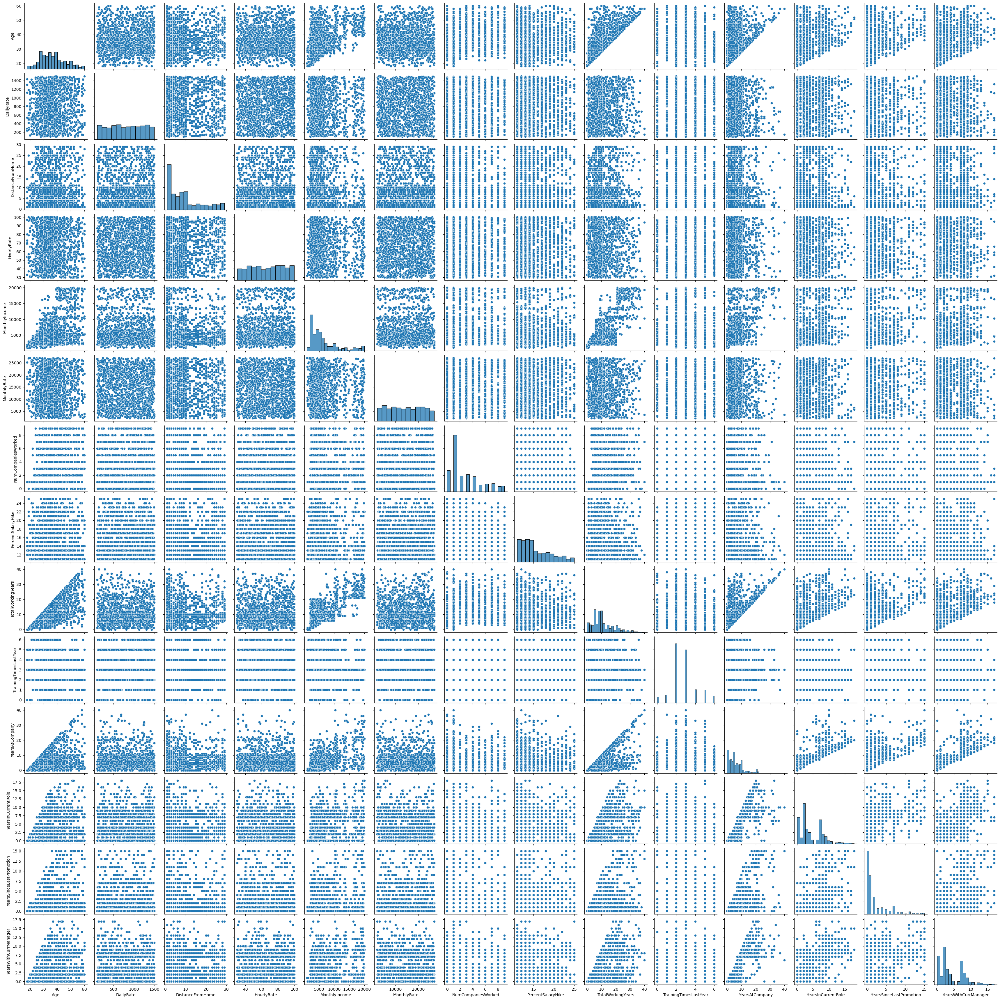

In [11]:
sns.pairplot(df[quantitative_columns])

## Escalando los datos

,Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.446350,0.742527,-1.010909,1.383138,-0.108350,0.726020,2.125136,-1.150554,-0.421642,-2.171982,-0.164613,-0.063296,-0.679146,0.245834
1,1.322365,-1.297775,-0.147150,-0.240677,-0.291719,1.488876,-0.678049,2.129306,-0.164511,0.155707,0.488508,0.764998,-0.368715,0.806541
2,0.008343,1.414363,-0.887515,1.284725,-0.937654,-1.674841,1.324226,-0.057267,-0.550208,0.155707,-1.144294,-1.167687,-0.679146,-1.155935
3,-0.429664,1.461466,-0.764121,-0.486709,-0.763634,1.243211,-0.678049,-1.150554,-0.421642,0.155707,0.161947,0.764998,0.252146,-1.155935
4,-1.086676,-0.524295,-0.887515,-1.274014,-0.644858,0.325900,2.525591,-0.877232,-0.678774,0.155707,-0.817734,-0.615492,-0.058285,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.101159,0.202082,1.703764,-1.224807,-0.835451,-0.284329,0.523316,0.489376,0.735447,0.155707,-0.327893,-0.615492,-0.679146,-0.314873
1466,0.227347,-0.469754,-0.393938,-1.175601,0.741140,1.004010,0.523316,-0.057267,-0.293077,1.707500,-0.001333,0.764998,-0.368715,0.806541
1467,-1.086676,-1.605183,-0.640727,1.038693,-0.076690,-1.284418,-0.678049,1.309341,-0.678774,-2.171982,-0.164613,-0.615492,-0.679146,-0.314873
1468,1.322365,0.546677,-0.887515,-0.142264,-0.236474,-0.150393,-0.277594,-0.330589,0.735447,0.155707,0.325228,0.488900,-0.679146,1.086895


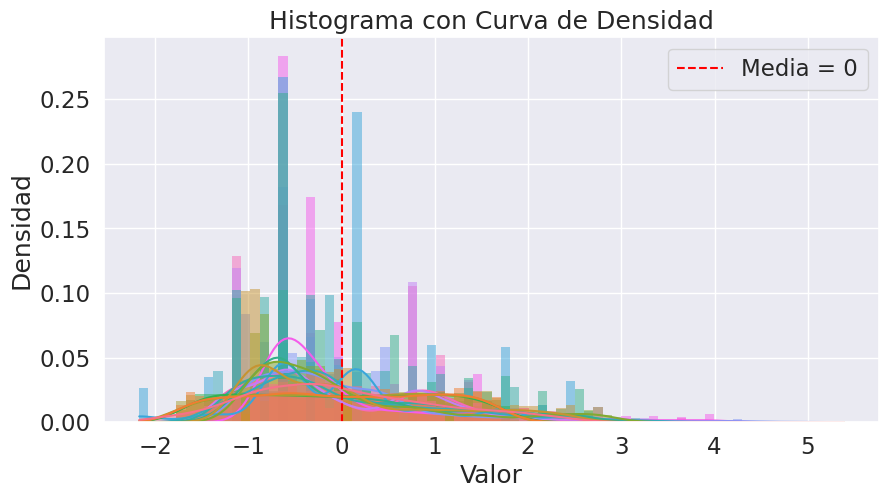

In [32]:
scaler = StandardScaler()
scaled_columns = scaler.fit_transform(df[quantitative_columns])

scaled_df = pd.DataFrame(scaled_columns, columns=quantitative_columns)


display(scaled_df)

# Histograma con Curva de Densidad
plt.figure(figsize=(10, 5))
sns.histplot(scaled_columns, kde=True, color='skyblue', stat="density", linewidth=0)
plt.axvline(0, color='red', linestyle='--', label='Media = 0')
plt.title("Histograma con Curva de Densidad")
plt.xlabel("Valor")
plt.ylabel("Densidad")
plt.legend()
plt.show()

En este gráfico observamos que efectivamente el escalamiento lo está haciendo bien, ahora veamos la matriz de covarianza

## Matriz de Covarianza Inicial

In [74]:
correlation_matrix = scaled_df.corr()

Index(['Age', 'MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

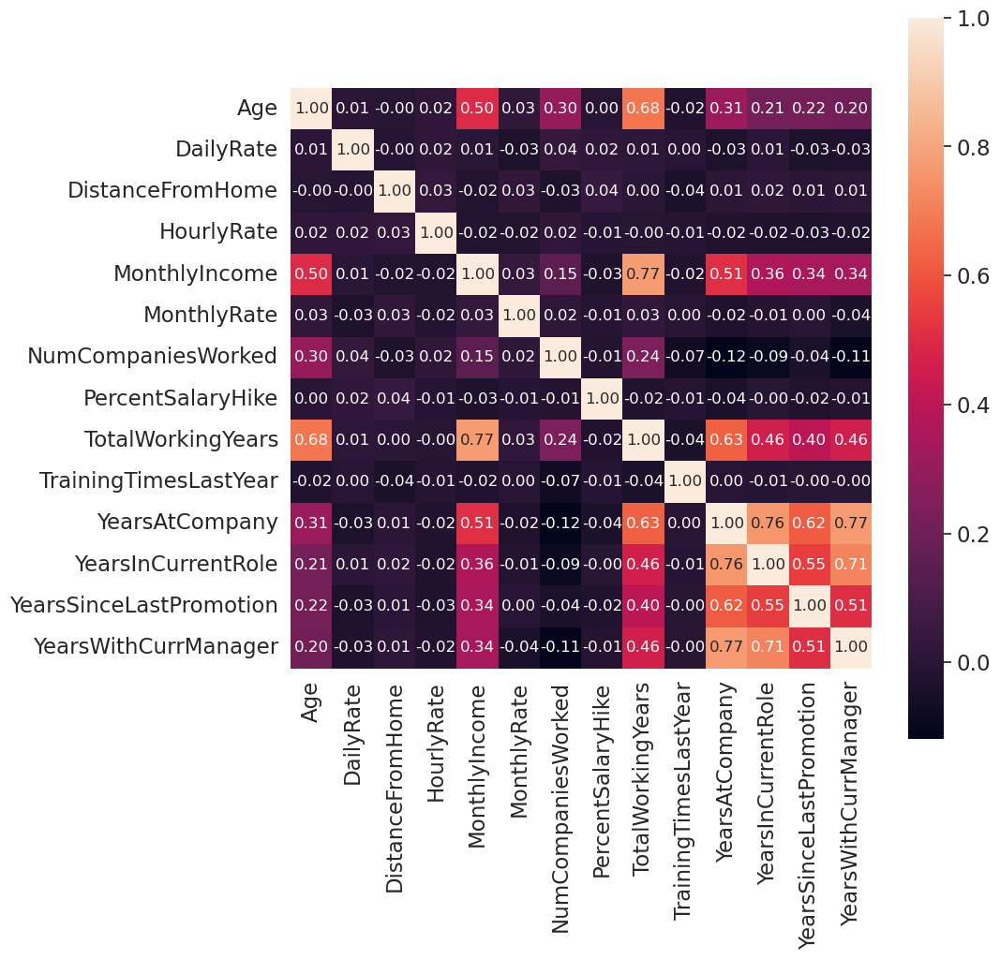

In [52]:
plt.figure(figsize=(10,10))
sns.set(font_scale=1.5)
hm = sns.heatmap(correlation_matrix, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 12}, xticklabels=quantitative_columns, yticklabels=quantitative_columns)

## Definiendo con que columnas trabajar.
Seleccionar las columnas que tienen mayor sinergia

In [76]:
def loop(x):
    # lambda x: any(abs(x) >= 0.5 and x.name != x.idxmax()
    current_column = x.name
    columns = [x[0] for x in x.items()]
    # to avoid compare with self
    columns.remove(current_column)
    return any(x[columns] >= 0.5)

high_corr_columns = correlation_matrix.apply(lambda x: loop(x) ,axis=0)
selected_columns = correlation_matrix.columns[high_corr_columns]
print('Columnas que nos podrían ayudar a reducir la dimensionalidad')
print(list(selected_columns))

Columnas que nos podrían ayudar a reducir la dimensionalidad
['Age', 'MonthlyIncome', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


## Matriz de Covarianza Final

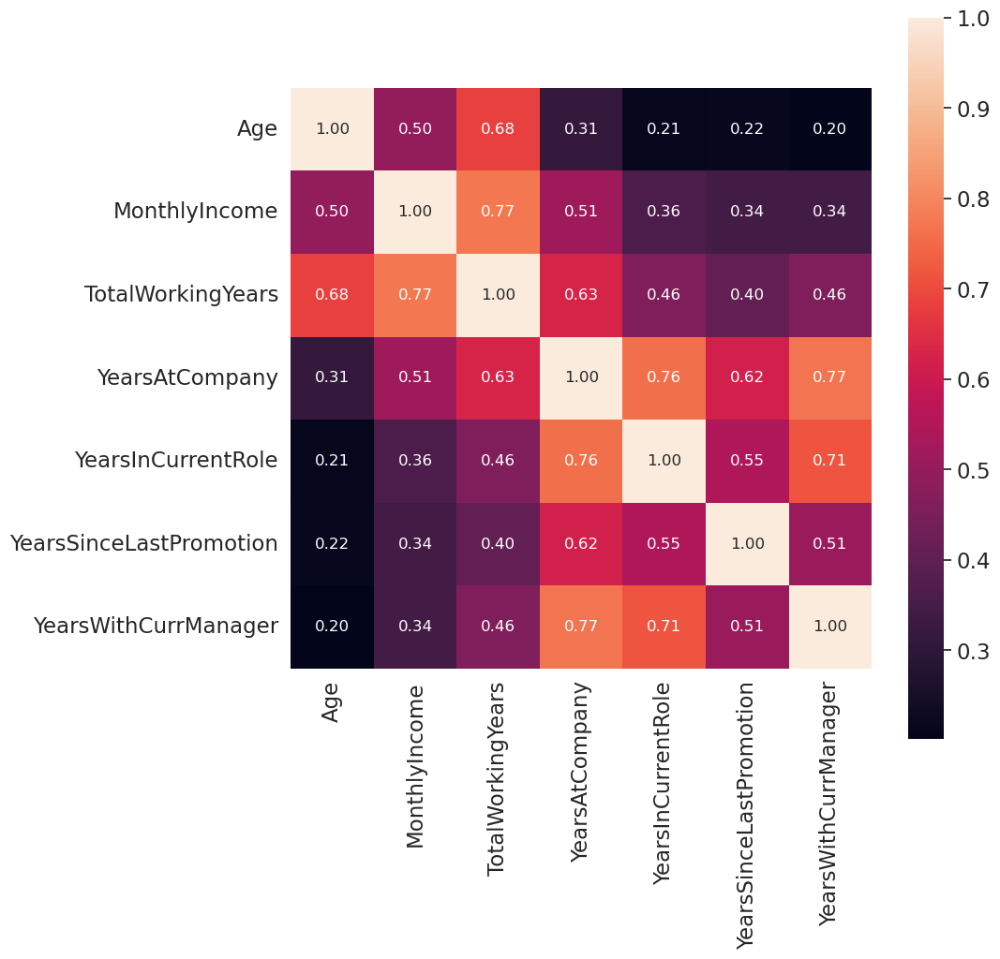

In [77]:
correlation_matrix = scaled_df[selected_columns].corr()

plt.figure(figsize=(10,10))
sns.set(font_scale=1.5)
hm = sns.heatmap(correlation_matrix, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 12}, xticklabels=selected_columns, yticklabels=selected_columns)

## Validando que haya sinergia con diagrama de dispersión solo con las columnas seleccionadas

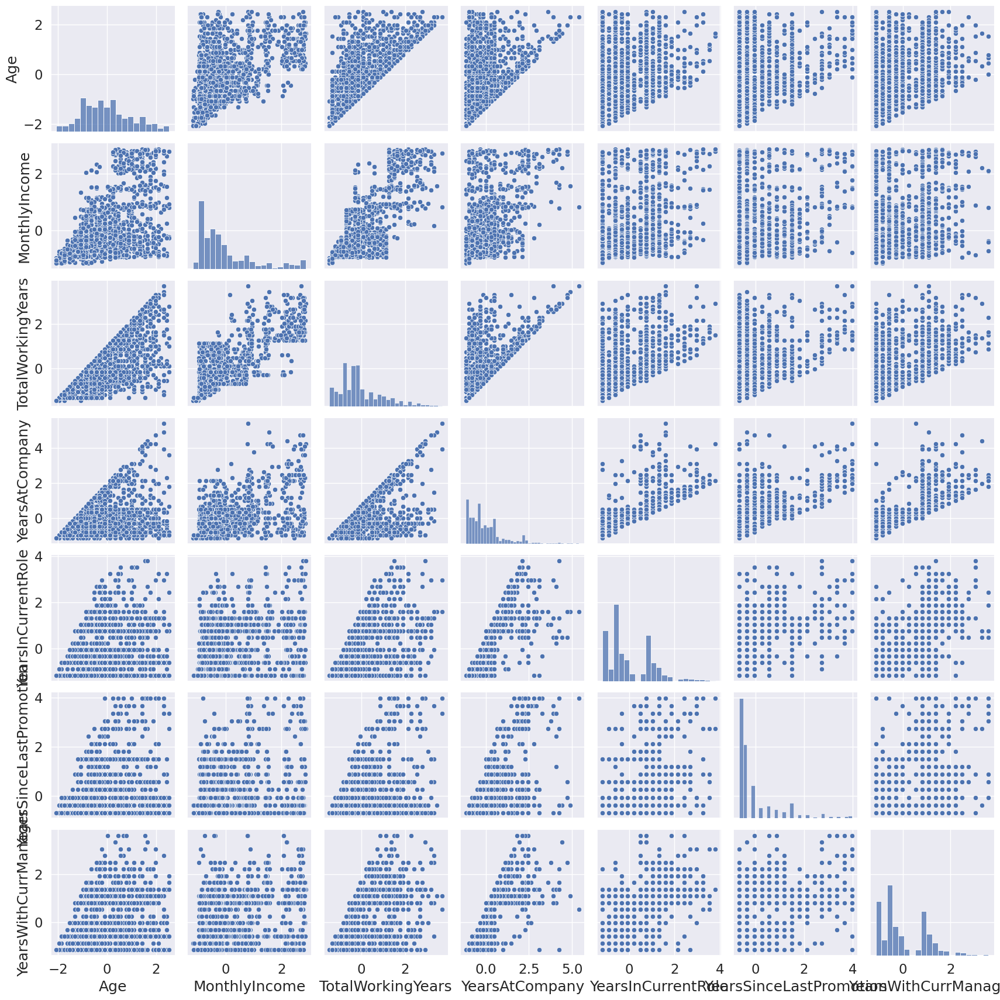

In [79]:
sns.pairplot(scaled_df[selected_columns])

## Análisis PCA

In [112]:
# Aplicar PCA
n_components = 3
main_components = [f'PC{i+1}' for i in range(3)]
pca = PCA(n_components=n_components)  # Cambia n_components si deseas más componentes
X_pca = pca.fit_transform(scaled_df[selected_columns])

# Crear un DataFrame con las componentes principales
pca_df = pd.DataFrame(data=X_pca, columns=main_components)


,PC1,PC2,PC3
0,-0.326756,0.197177,-0.600168
1,0.898179,0.013876,-0.757293
2,-2.214186,0.662104,0.287809
3,-0.556600,-0.671115,0.477447
4,-1.671269,-0.522931,0.402965
...,...,...,...
1465,-0.769105,0.471129,-0.343582
1466,0.694229,-0.144637,-0.783832
1467,-1.281852,-0.375339,-0.344039
1468,1.110417,0.499166,-1.117769


,Número de Componentes,Varianza Acumulada
0,1,0.573182
1,2,0.764012
2,3,0.840878


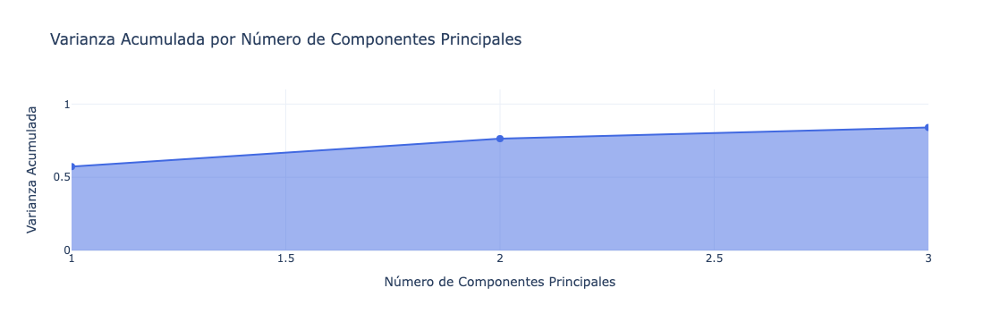

In [162]:
# Explicar la varianza
explained_variance = pca.explained_variance_ratio_

variance_acum = np.cumsum(explained_variance)

# Crear un DataFrame para el gráfico
explained_variance_df = pd.DataFrame({
    'Número de Componentes': range(1, len(variance_acum) + 1),
    'Varianza Acumulada': variance_acum
})

display(explained_variance_df)

# Crear el gráfico de varianza acumulada con relleno
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=explained_variance_df['Número de Componentes'],
    y=explained_variance_df['Varianza Acumulada'],
    mode='lines+markers',
    fill='tozeroy',  # Relleno debajo de la línea hasta el eje Y
    marker=dict(size=8),
    line=dict(color='royalblue', width=2),
    name='Varianza Acumulada'
))

# Configurar el diseño del gráfico
fig.update_layout(
    title='Varianza Acumulada por Número de Componentes Principales',
    xaxis_title='Número de Componentes Principales',
    yaxis_title='Varianza Acumulada',
    yaxis=dict(range=[0, 1.1]),  # Limitar el eje Y
    template='plotly_white'
)

# Mostrar el gráfico
fig.show()

In [113]:
# Obtener las cargas de las variables para los tres componentes principales
cargas = pca.components_

# Crear un DataFrame para visualizar las cargas
cargas_df = pd.DataFrame(cargas, columns=selected_columns, index=main_components)
cargas_df

,Age,MonthlyIncome,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
PC1,0.277461,0.359360,0.413434,0.445329,0.393267,0.345390,0.388171
PC2,0.571863,0.398043,0.388485,-0.217442,-0.348460,-0.262491,-0.354974
PC3,0.060878,-0.026174,-0.069855,-0.118766,-0.228923,0.888457,-0.367237


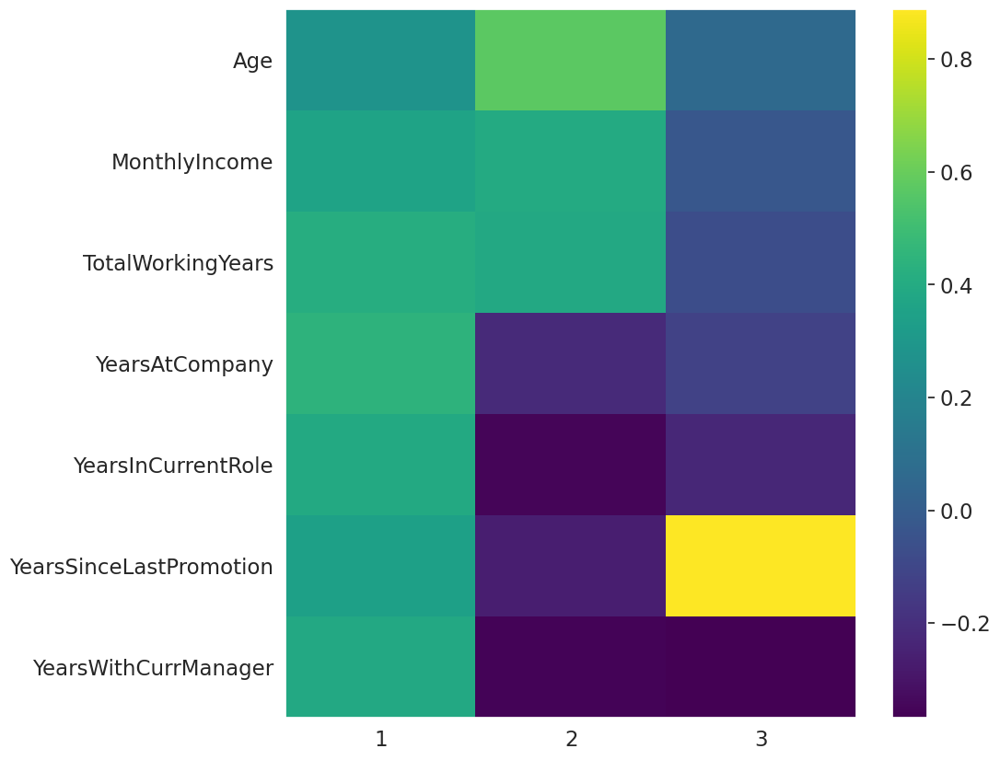

In [109]:
# Heatmap componentes
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
componentes = cargas
plt.imshow(componentes.T, cmap='viridis', aspect='auto')
plt.yticks(range(len(scaled_df[selected_columns].columns)), scaled_df[selected_columns].columns)
plt.xticks(range(len(pca_df.columns)), np.arange(pca.n_components_) + 1)
plt.grid(False)
plt.colorbar();

## PC1 Explicacion

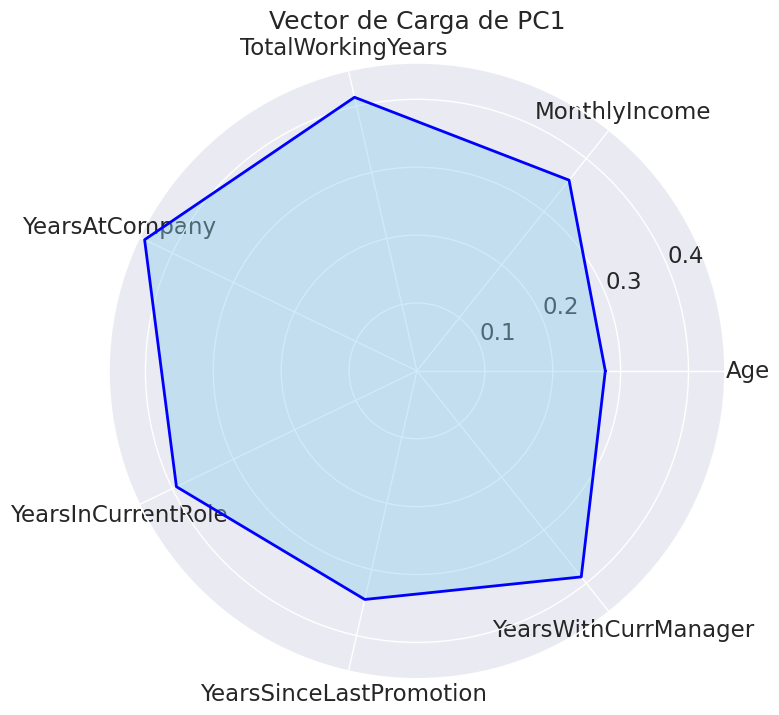

In [163]:
# Crear un DataFrame con los valores de carga de PC3

loading_df = cargas_df
    
# Preparar los datos para el gráfico de radar
labels = loading_df.columns.tolist()
values = loading_df.iloc[0, :].tolist()

values += values[:1]  # Repetir el primer valor para cerrar el círculo

# # Configuración del gráfico polar
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
angles += angles[:1]  # Repetir el primer ángulo para cerrar el círculo

# # Crear el gráfico de radar
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, values, color='blue', linewidth=2, linestyle='solid')
ax.fill(angles, values, color='skyblue', alpha=0.4)

# Añadir etiquetas
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Título del gráfico
plt.title('Vector de Carga de PC1')
plt.show()

PC1 Describe la Experiencia Laboral desde el punto de vista de años, algo ha considerar aquí que este componenete muestra que no necesariamente la experiencia laboral esta fuertemente correlacionada con la Edad

## PC2 Explicacion

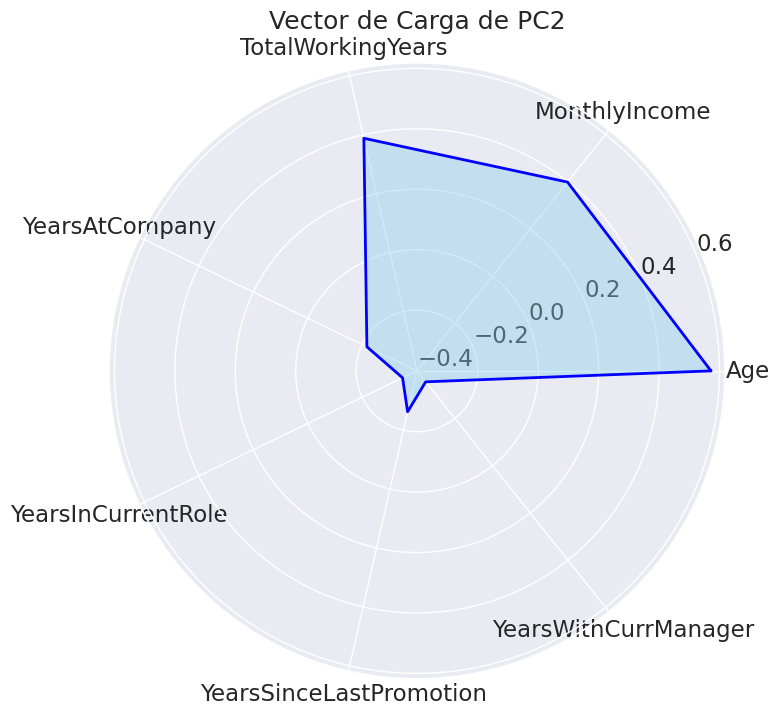

In [164]:
# Crear un DataFrame con los valores de carga de PC3

loading_df = cargas_df

# Preparar los datos para el gráfico de radar
labels = loading_df.columns.tolist()
values = loading_df.iloc[1, :].tolist()

values += values[:1]  # Repetir el primer valor para cerrar el círculo

# # Configuración del gráfico polar
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
angles += angles[:1]  # Repetir el primer ángulo para cerrar el círculo

# # Crear el gráfico de radar
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, values, color='blue', linewidth=2, linestyle='solid')
ax.fill(angles, values, color='skyblue', alpha=0.4)

# Añadir etiquetas
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Título del gráfico
plt.title('Vector de Carga de PC2')
plt.show()

PC2 Describe una fuerte relación con la Edad y Total años de trabajo, pero inversamente a Años con el mismo Manager. Podemos describir como un componente que describe Experiencia Laboral y Tiempo en la Compañía.

## PC3 Explicación

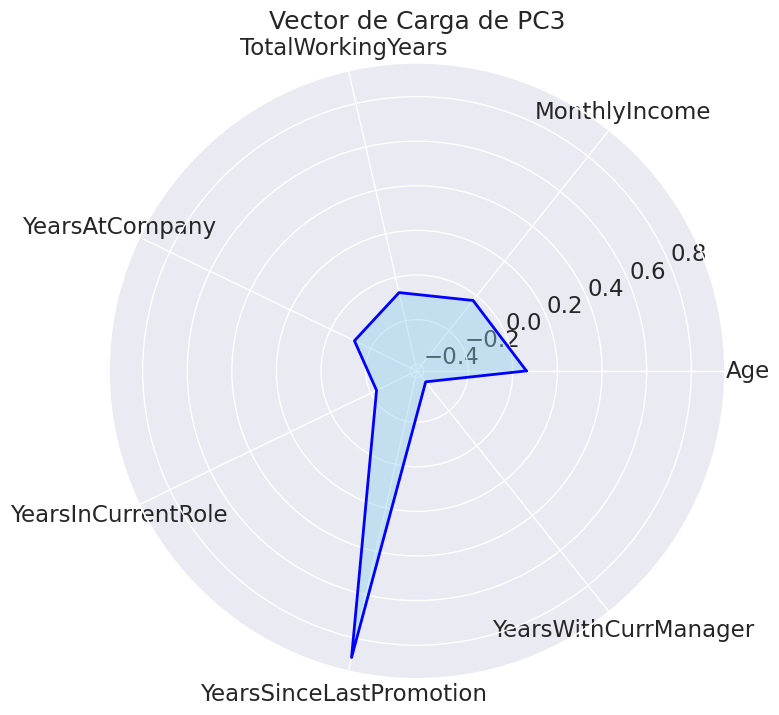

In [165]:
# Crear un DataFrame con los valores de carga de PC3

loading_df = cargas_df

# Preparar los datos para el gráfico de radar
labels = loading_df.columns.tolist()
values = loading_df.iloc[2, :].tolist()

values += values[:1]  # Repetir el primer valor para cerrar el círculo

# # Configuración del gráfico polar
angles = [n / float(len(labels)) * 2 * pi for n in range(len(labels))]
angles += angles[:1]  # Repetir el primer ángulo para cerrar el círculo

# # Crear el gráfico de radar
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, values, color='blue', linewidth=2, linestyle='solid')
ax.fill(angles, values, color='skyblue', alpha=0.4)

# Añadir etiquetas
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

# Título del gráfico
plt.title('Vector de Carga de PC3')
plt.show()

Este componente describe El avance en la compañía y el tiempo sobre un mismo Manager